In [1]:
# Библиотеки
%pip install pandas numpy
import pandas as pd
import numpy as np
import json
import os

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: C:\Users\Valentin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
# Файл Orders
# OrderID - ID Заказа,
# UserID - ID клиента,
# OrderTime - время заказа,
# items - список элементов в заказе, каждый элемент описан словарем:
#  ItemID  - ID продукта, 
#  price - цена единицы товара, 
# quantity - количество единиц товара в заказе

# Файл Categories

# ItemID - ID продукта,
# Category - категория продукта,
# ParentCategory - более крупная категория продукта

In [ ]:
# Задание
# 1.Визуализируйте динамику продаж напитков в ParentCategory. Есть ли эффект сезонности в продажах?
# 2.Исследуйте и покажите на графике, как отличаются продажи в будние и выходные в категориях 'Сокосодержащие напитки, смузи' и "Печенье" ?
# 3.Визуализируйте структуру продаж ParentCategory по показателю GMV за один месяц. Укажите категорию с наибольшей долей GMV.
# 4.Исследуйте взаимосвясь между продажами категорий 'Чипсы, снеки, попкорн' и 
# напитками:'Вода', 'Газированные напитки', 'Соки, нектары', 'Лимонады', 'Безалкогольное пиво', 'Вино', 'Пиво'. С чем сильнее коррелируют 'Чипсы, снеки, попкорн'?

In [2]:
# Чтение файлов
categories=pd.read_csv('..\Home_worK\categories.csv')
orders=pd.read_json(os.path.join('..','Home_worK','orders.json'))

In [10]:
categories.query('ParentCategory=="Напитки"')

,ItemID,Category,ParentCategory
1,1000046,Вода,Напитки
3,1000049,Вода,Напитки
20,1000115,Кофе,Напитки
30,1000221,"Соки, нектары",Напитки
35,1000237,"Соки, нектары",Напитки
...,...,...,...
34952,999114,Квас и квасные напитки,Напитки
34953,999115,"Морсы, узвары, кисели, компоты",Напитки
34955,999120,Лимонады,Напитки
34961,999260,Газированные напитки,Напитки


In [12]:
doom=orders.explode('items',ignore_index = True)
purch=list([])
for i in range(len(doom)):
    q=list([])
    g=list(doom['items'][i].values())
    p=doom['Date'][i]
    g.append(p)
    purch.append(g)
purch_table=pd.DataFrame(purch,columns=['ItemID', 'price','quantity','date']);
purch_table['income']=purch_table['price']*purch_table['quantity'];
purch_table['ItemID']=purch_table['ItemID'].astype(int)
total_tab=pd.merge(purch_table,categories, on='ItemID');
total_tab.head(5)

,ItemID,price,quantity,date,income,Category,ParentCategory
0,413736,36.72,2,2021-01-01,73.44,Мороженое,Молочная продукция
1,523171,90.32,1,2021-01-01,90.32,Полуфабрикаты,Бакалея
2,452831,223.11,1,2021-01-01,223.11,Овощные смеси,Овощи и фрукты
3,303673,59.90,7,2021-01-01,419.30,Фрукты,Овощи и фрукты
4,318193,319.91,2,2021-01-01,639.82,Фрукты,Овощи и фрукты


In [73]:
%pip install scipy seaborn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: C:\Users\Valentin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [74]:
import matplotlib.pyplot as plt
import seaborn as sns

In [98]:
a=total_tab.query('ParentCategory=="Напитки"')
a.groupby('date')['quantity'].sum()
sales=a.groupby(['date'])['quantity'].sum().reset_index();
sales.sort_values(by='quantity', ascending=False)

,date,quantity
42,2021-02-12,1876
68,2021-03-10,1776
46,2021-02-16,1748
35,2021-02-05,1737
118,2021-04-29,1681
...,...,...
53,2021-02-23,745
1,2021-01-02,733
121,2021-05-02,718
155,2021-06-05,710


In [417]:
drinks=total_tab.query('ParentCategory=="Напитки"')
drinks
drinks.groupby(['date','ParentCategory'])['income'].sum()
drink=drinks.groupby(['date','ParentCategory'])['income'].sum().reset_index();
drink




,date,ParentCategory,income
0,2021-01-01,Напитки,22520.77
1,2021-01-02,Напитки,62638.15
2,2021-01-03,Напитки,68997.68
3,2021-01-04,Напитки,89075.82
4,2021-01-05,Напитки,73227.55
...,...,...,...
176,2021-06-26,Напитки,108712.91
177,2021-06-27,Напитки,71483.97
178,2021-06-28,Напитки,90723.87
179,2021-06-29,Напитки,66505.10


In [280]:

table_1=pd.merge(sales,drink, on='date', how='left')
table_1
table_1['Month'] = pd.DatetimeIndex(table_1['date']).month
Quarter_Mapping = {1:1, 2:1, 3:1, 4:2, 5:2, 6:2, 7:3, 8:3, 9:3, 10:4, 11:4, 12:4}
table_1['Quarter'] = table_1['Month'].map(Quarter_Mapping)
table_1

,date,quantity,ParentCategory,income,Month,Quarter
0,2021-01-01,279,Напитки,22520.77,1,1
1,2021-01-02,733,Напитки,62638.15,1,1
2,2021-01-03,845,Напитки,68997.68,1,1
3,2021-01-04,1106,Напитки,89075.82,1,1
4,2021-01-05,974,Напитки,73227.55,1,1
...,...,...,...,...,...,...
176,2021-06-26,1468,Напитки,108712.91,6,2
177,2021-06-27,1087,Напитки,71483.97,6,2
178,2021-06-28,955,Напитки,90723.87,6,2
179,2021-06-29,901,Напитки,66505.10,6,2


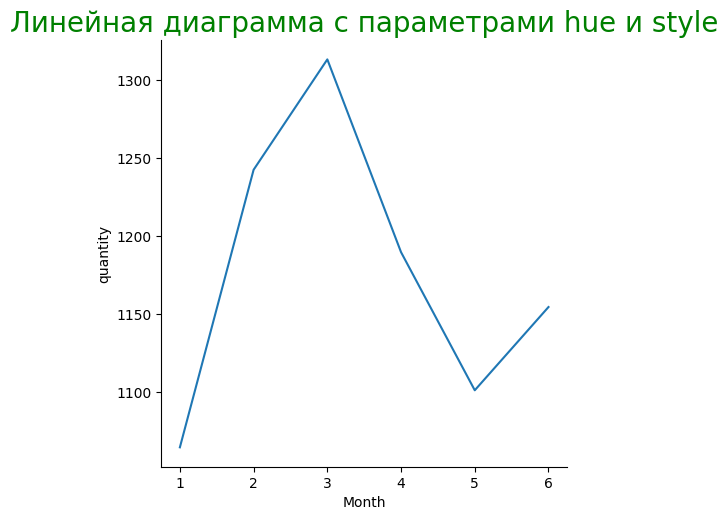

In [281]:
sns.relplot(
    x='Month',
    y='quantity', 
    dashes=False, 
    markers=True,
    data=table_1, 
    kind='line', 
    errorbar=None)
plt.title('Линейная диаграмма с параметрами hue и style', size=20, color='g');

In [153]:
total_tab.head(5)

,ItemID,price,quantity,date,income,Category,ParentCategory
0,413736,36.72,2,2021-01-01,73.44,Мороженое,Молочная продукция
1,523171,90.32,1,2021-01-01,90.32,Полуфабрикаты,Бакалея
2,452831,223.11,1,2021-01-01,223.11,Овощные смеси,Овощи и фрукты
3,303673,59.90,7,2021-01-01,419.30,Фрукты,Овощи и фрукты
4,318193,319.91,2,2021-01-01,639.82,Фрукты,Овощи и фрукты


In [283]:
# 2.Исследуйте и покажите на графике, как отличаются продажи в будние и выходные в категориях 'Сокосодержащие напитки, смузи' и "Печенье" ?
from datetime import datetime as dt
total_tab.head(5)
a_1=total_tab[total_tab['Category']=='Сокосодержащие напитки, смузи'].reset_index()
a_1
a_2=total_tab[total_tab['Category']=='Печенье'].reset_index()
prod=pd.concat([a_1,a_2])
prod.Category.value_counts().head()
prod['daywk']=prod['date'].dt.day_name()
prod['weekend']=''
prod=prod.reset_index(drop = True)
for i in range(len(prod)):
    if prod['daywk'][i]=='Sunday':
        prod['weekend'][i]='Y'
    else:
        prod['weekend'][i]='N'
prod.head()

C:\Users\Valentin\AppData\Local\Temp\ipykernel_10600\2478795031.py:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  prod['weekend'][i]='N'
C:\Users\Valentin\AppData\Local\Temp\ipykernel_10600\2478795031.py:18: SettingWithCopyWarning: 
A val

,index,ItemID,price,quantity,date,income,Category,ParentCategory,daywk,weekend
0,343,461730,186.00,1,2021-01-01,186.00,"Сокосодержащие напитки, смузи",Напитки,Friday,N
1,568,313570,38.13,1,2021-01-01,38.13,"Сокосодержащие напитки, смузи",Напитки,Friday,N
2,573,306593,38.13,2,2021-01-01,76.26,"Сокосодержащие напитки, смузи",Напитки,Friday,N
3,578,461089,38.13,1,2021-01-01,38.13,"Сокосодержащие напитки, смузи",Напитки,Friday,N
4,583,316409,38.13,1,2021-01-01,38.13,"Сокосодержащие напитки, смузи",Напитки,Friday,N


In [284]:
prod

,index,ItemID,price,quantity,date,income,Category,ParentCategory,daywk,weekend
0,343,461730,186.00,1,2021-01-01,186.00,"Сокосодержащие напитки, смузи",Напитки,Friday,N
1,568,313570,38.13,1,2021-01-01,38.13,"Сокосодержащие напитки, смузи",Напитки,Friday,N
2,573,306593,38.13,2,2021-01-01,76.26,"Сокосодержащие напитки, смузи",Напитки,Friday,N
3,578,461089,38.13,1,2021-01-01,38.13,"Сокосодержащие напитки, смузи",Напитки,Friday,N
4,583,316409,38.13,1,2021-01-01,38.13,"Сокосодержащие напитки, смузи",Напитки,Friday,N
...,...,...,...,...,...,...,...,...,...,...
13648,852608,310439,29.90,3,2021-06-30,89.70,Печенье,Мучные изделия,Wednesday,N
13649,852684,312021,49.90,1,2021-06-30,49.90,Печенье,Мучные изделия,Wednesday,N
13650,852740,312021,49.90,2,2021-06-30,99.80,Печенье,Мучные изделия,Wednesday,N
13651,852744,304614,75.51,1,2021-06-30,75.51,Печенье,Мучные изделия,Wednesday,N


In [301]:
prof=prod.groupby(['date','Category'])['quantity'].sum().reset_index()
prof['daywk']=prof['date'].dt.day_name()
prof['weekend']=''
prof=prof.reset_index(drop = True)
for i in range(len(prof)):
    if prof['daywk'][i]=='Sunday':
        prof['weekend'][i]='Y'
    else:
        prof['weekend'][i]='N'
prof['Month'] = pd.DatetimeIndex(prof['date']).month
Quarter_Mapping = {1:1, 2:1, 3:1, 4:2, 5:2, 6:2, 7:3, 8:3, 9:3, 10:4, 11:4, 12:4}
prof['Quarter'] = prof['Month'].map(Quarter_Mapping)
prof

C:\Users\Valentin\AppData\Local\Temp\ipykernel_10600\1657180811.py:9: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  prof['weekend'][i]='N'
C:\Users\Valentin\AppData\Local\Temp\ipykernel_10600\1657180811.py:9: SettingWithCopyWarning: 
A value

,date,Category,quantity,daywk,weekend,Month,Quarter
0,2021-01-01,Печенье,26,Friday,N,1,1
1,2021-01-01,"Сокосодержащие напитки, смузи",7,Friday,N,1,1
2,2021-01-02,Печенье,43,Saturday,N,1,1
3,2021-01-02,"Сокосодержащие напитки, смузи",2,Saturday,N,1,1
4,2021-01-03,Печенье,58,Sunday,Y,1,1
...,...,...,...,...,...,...,...
349,2021-06-28,"Сокосодержащие напитки, смузи",10,Monday,N,6,2
350,2021-06-29,Печенье,94,Tuesday,N,6,2
351,2021-06-29,"Сокосодержащие напитки, смузи",6,Tuesday,N,6,2
352,2021-06-30,Печенье,92,Wednesday,N,6,2


In [307]:
prof.rename(columns={'quantity': 'sales'},inplace=True)
prof

,date,Category,sales,daywk,weekend,Month,Quarter
0,2021-01-01,Печенье,26,Friday,N,1,1
1,2021-01-01,"Сокосодержащие напитки, смузи",7,Friday,N,1,1
2,2021-01-02,Печенье,43,Saturday,N,1,1
3,2021-01-02,"Сокосодержащие напитки, смузи",2,Saturday,N,1,1
4,2021-01-03,Печенье,58,Sunday,Y,1,1
...,...,...,...,...,...,...,...
349,2021-06-28,"Сокосодержащие напитки, смузи",10,Monday,N,6,2
350,2021-06-29,Печенье,94,Tuesday,N,6,2
351,2021-06-29,"Сокосодержащие напитки, смузи",6,Tuesday,N,6,2
352,2021-06-30,Печенье,92,Wednesday,N,6,2


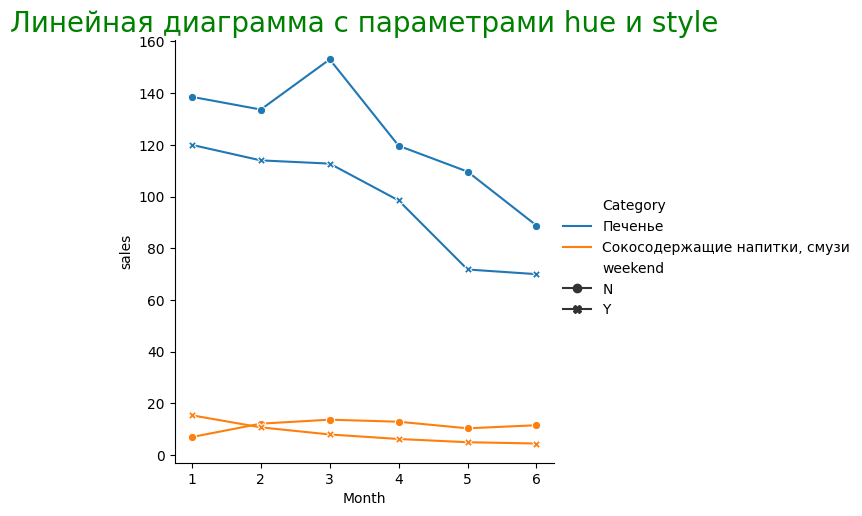

In [308]:
sns.relplot(
    x='Month',
    y='sales', 
    hue='Category',
    style='weekend', 
    dashes=False, 
    markers=True,
    data=prof, 
    kind='line', 
    errorbar=None)
plt.title('Линейная диаграмма с параметрами hue и style', size=20, color='g');

In [329]:
# 3.Визуализируйте структуру продаж ParentCategory по показателю GMV за один месяц. Укажите категорию с наибольшей долей GMV.
rol=total_tab.groupby(['date','ParentCategory'])['income'].sum().reset_index()
rol.sort_values(by='income', ascending=False)
rol['Month'] = pd.DatetimeIndex(rol['date']).month
Quarter_Mapping = {1:1, 2:1, 3:1, 4:2, 5:2, 6:2, 7:3, 8:3, 9:3, 10:4, 11:4, 12:4}
rol['Quarter'] = rol['Month'].map(Quarter_Mapping)
rol
ref=rol.groupby(['Month','ParentCategory'])['income'].sum().reset_index()
result=ref.query('Month==1')

,Month,ParentCategory,income
0,1,Бакалея,4543752.43
1,1,Бытовая химия,1329185.07
2,1,Для детей,439751.93
3,1,Для дома и сада,222757.32
4,1,Для праздника,86281.91
...,...,...,...
97,6,Напитки,2590227.20
98,6,Овощи и фрукты,3428748.05
99,6,Системы нагревания,16920.00
100,6,Сладости,601311.82


In [383]:
result=ref.query('Month==1').sort_values('income', ascending=False).reset_index().nlargest(8, 'income')
result['ParentCategory']=result['ParentCategory'].astype('string')

In [384]:
result

,index,Month,ParentCategory,income
0,11,1,"Мясо, птица, рыба",5802670.85
1,13,1,Овощи и фрукты,5109905.76
2,9,1,Молочная продукция,5041362.71
3,0,1,Бакалея,4543752.43
4,12,1,Напитки,2831980.29
5,7,1,"Красота, гигиена, здоровье",1462707.49
6,10,1,Мучные изделия,1372622.11
7,1,1,Бытовая химия,1329185.07


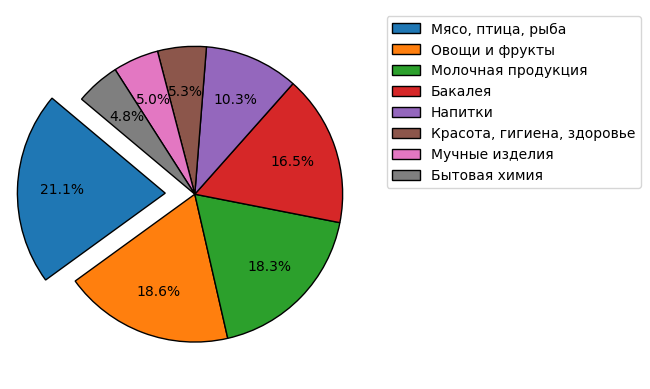

In [385]:
v = result['income']
labels = result['ParentCategory']
explode=[]
for i in range(len(result)):
    if i==0:
        explode.append(0.2)
    else:
        explode.append(0)
wedge_properties = {"edgecolor":"k",'linewidth': 1}

fig, ax = plt.subplots()
ax.pie(v, explode=explode, wedgeprops=wedge_properties,startangle=140, autopct="%1.1f%%", pctdistance=0.7)
ax.legend(labels, loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

In [404]:
# Исследуйте взаимосвясь между продажами категорий 'Чипсы, снеки, попкорн' и напитками:'Вода', 
# 'Газированные напитки', 'Соки, нектары', 'Лимонады', 'Безалкогольное пиво', 'Вино', 'Пиво'. С чем сильнее коррелируют 'Чипсы, снеки, попкорн'?
#a_1=total_tab[total_tab['Category']=='Сокосодержащие напитки, смузи'].reset_index()
total_tab.head(5)
qule=total_tab.groupby(['date','Category'])['quantity'].sum().reset_index()
qule=qule.loc[((qule['Category']=='Чипсы, снеки, попкорн')|(qule['Category']=='Вода')|(qule['Category']=='Газированные напитки')|(qule['Category']=='Соки, нектары')|
               (qule['Category']=='Лимонады')|(qule['Category']=='Безалкогольное пиво')|(qule['Category']=='Вино')|(qule['Category']=='Пино'))]
qule['Month'] = pd.DatetimeIndex(qule['date']).month
qule
ret = pd.DataFrame(qule.groupby(["Category", "date"]).quantity.mean())
ret= ret.reset_index()
ret = ret.pivot(index='date', columns='Category', values='quantity')
ret.head(10)
qule

,date,Category,quantity,Month
7,2021-01-01,Безалкогольное пиво,7,1
19,2021-01-01,Вода,154,1
22,2021-01-01,Газированные напитки,12,1
73,2021-01-01,Лимонады,5,1
139,2021-01-01,"Соки, нектары",40,1
...,...,...,...,...
42726,2021-06-30,Безалкогольное пиво,44,6
42740,2021-06-30,Вода,785,6
42744,2021-06-30,Газированные напитки,77,6
42814,2021-06-30,Лимонады,6,6


In [409]:
ret

Category,Безалкогольное пиво,Вино,Вода,Газированные напитки,Лимонады,"Соки, нектары","Чипсы, снеки, попкорн"
date,,,,,,,
2021-01-01,7.0,NaN,154.0,12.0,5.0,40.0,NaN
2021-01-02,NaN,NaN,476.0,24.0,3.0,84.0,3.0
2021-01-03,11.0,NaN,408.0,42.0,12.0,155.0,4.0
2021-01-04,9.0,NaN,547.0,95.0,22.0,137.0,6.0
2021-01-05,NaN,NaN,423.0,94.0,38.0,178.0,4.0
...,...,...,...,...,...,...,...
2021-06-26,14.0,NaN,978.0,57.0,20.0,96.0,NaN
2021-06-27,5.0,NaN,652.0,42.0,40.0,139.0,NaN
2021-06-28,6.0,NaN,464.0,46.0,33.0,139.0,NaN


In [412]:
corr = ret.corr()
ret.head(10)

Category,Безалкогольное пиво,Вино,Вода,Газированные напитки,Лимонады,"Соки, нектары","Чипсы, снеки, попкорн"
date,,,,,,,
2021-01-01,7.0,NaN,154.0,12.0,5.0,40.0,NaN
2021-01-02,NaN,NaN,476.0,24.0,3.0,84.0,3.0
2021-01-03,11.0,NaN,408.0,42.0,12.0,155.0,4.0
2021-01-04,9.0,NaN,547.0,95.0,22.0,137.0,6.0
2021-01-05,NaN,NaN,423.0,94.0,38.0,178.0,4.0
2021-01-06,9.0,NaN,386.0,111.0,7.0,70.0,4.0
2021-01-07,12.0,NaN,445.0,92.0,7.0,103.0,7.0
2021-01-08,39.0,NaN,594.0,41.0,15.0,69.0,10.0
2021-01-09,10.0,NaN,490.0,45.0,22.0,137.0,4.0


In [413]:
corr

Category,Безалкогольное пиво,Вино,Вода,Газированные напитки,Лимонады,"Соки, нектары","Чипсы, снеки, попкорн"
Category,,,,,,,
Безалкогольное пиво,1.000000,0.124498,0.173709,0.117820,0.191810,0.144657,-0.053603
Вино,0.124498,1.000000,-0.182314,-0.050406,-0.081067,0.308867,NaN
Вода,0.173709,-0.182314,1.000000,0.326206,0.356696,0.298561,-0.080145
Газированные напитки,0.117820,-0.050406,0.326206,1.000000,0.194221,0.181231,-0.111498
Лимонады,0.191810,-0.081067,0.356696,0.194221,1.000000,0.261403,0.060179
"Соки, нектары",0.144657,0.308867,0.298561,0.181231,0.261403,1.000000,-0.035183
"Чипсы, снеки, попкорн",-0.053603,NaN,-0.080145,-0.111498,0.060179,-0.035183,1.000000


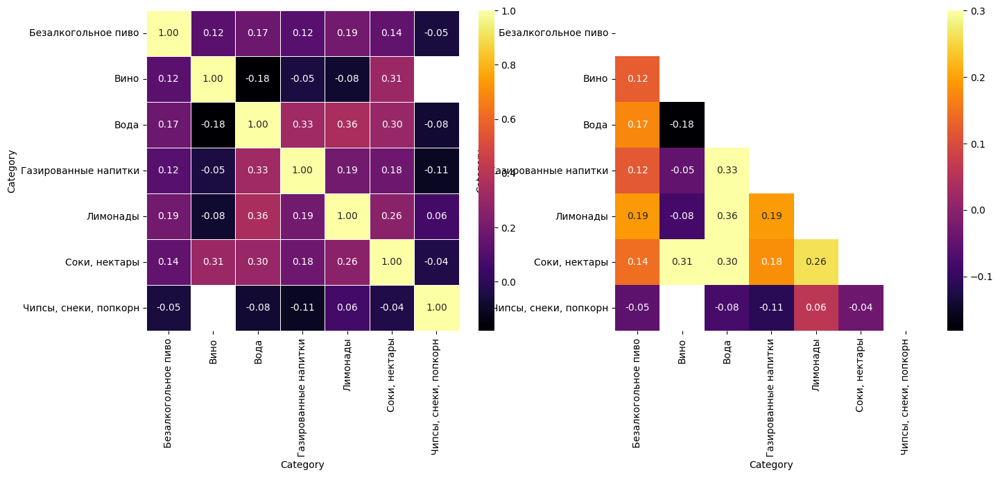

In [414]:
fig, (ax1, ax2)= plt.subplots(1,2, figsize=(16,6)) 
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr, mask=mask, vmax=.3, annot=True, fmt='.2f', cmap="inferno", ax=ax2)
sns.heatmap(corr, annot=True, fmt='.2f',linewidths=.5, cmap="inferno", ax=ax1);

plt.show()

In [416]:
total_tab.head(75)

,ItemID,price,quantity,date,income,Category,ParentCategory
0,413736,36.72,2,2021-01-01,73.44,Мороженое,Молочная продукция
1,523171,90.32,1,2021-01-01,90.32,Полуфабрикаты,Бакалея
2,452831,223.11,1,2021-01-01,223.11,Овощные смеси,Овощи и фрукты
3,303673,59.90,7,2021-01-01,419.30,Фрукты,Овощи и фрукты
4,318193,319.91,2,2021-01-01,639.82,Фрукты,Овощи и фрукты
...,...,...,...,...,...,...,...
70,308817,83.90,3,2021-01-01,251.70,Кефир,Молочная продукция
71,316258,45.90,1,2021-01-01,45.90,Белый хлеб,Мучные изделия
72,873482,249.90,1,2021-01-01,249.90,Фрукты,Овощи и фрукты
73,373580,349.90,3,2021-01-01,1049.70,Для ванны и туалета,Бытовая химия
